<h1>1.Import Library</h1>

In [1]:
#!pip install timm

In [1]:
!python --version
!pwd

Python 3.13.9
/data2/atran16/ProteinClassification_AnhTuanTran


In [40]:
import os
import json
import random
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

import tqdm
import torch
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.multiprocessing as mp
import matplotlib.pyplot as plt

import datetime
import traceback
import shutil

import torch
import torchvision
import torch.nn as nn
from torch import Tensor
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms

import torch.optim as optim
from torch.autograd import Variable
from torch.optim.lr_scheduler import MultiplicativeLR, StepLR, MultiStepLR, ConstantLR, LinearLR, PolynomialLR, CosineAnnealingLR, LambdaLR, ChainedScheduler, ExponentialLR, SequentialLR, ReduceLROnPlateau, CyclicLR, CosineAnnealingWarmRestarts


import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

import matplotlib.pyplot as plt
import seaborn as sns

import h5py
import cv2
from PIL import Image
from torchvision.transforms import transforms
from torch.utils.data import Dataset
import albumentations as A
from torchvision.transforms import InterpolationMode
from albumentations.pytorch import ToTensorV2
import timm
import csv
seed = 113
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

configs = {
    "train_protein_path": "/data2/atran16/ProteinClassification_AnhTuanTran/3D_PDB_Dataset/TrainProteinPNG600",
    "valid_protein_path": "/data2/atran16/ProteinClassification_AnhTuanTran/3D_PDB_Dataset/ValidProteinPNG60",
    "image_size": 224,
    "image_each_proteins": [600, 60],
    "n_channels": 3,
    "n_classes": 127,
    "model": "ResNet50", 
    "lr": 1e-03,
    "min_lr": 1e-07,
    "weighted_loss": 0,
    "device": "cuda:0",
    "batch_size": 32,
    "num_workers": 2,
    "earlyStopping": 1000,
    "max_epoch_num": 10,
    "plateau_patience": 10,
    "steplr": 50,
    "isDebug": 1,
    "optimizer_chose":"RAdam",
    "lr_scheduler":"CosineAnnealingLR",
    "project_name": "ProteinClassification",
    "wandb_api_key": "Qbo3kwrtRENVIG8hqrfSVpYn5dc_mvxp0fRvc4DE",
    "name_run_wandb":"Tuan_dep_trai_ne",
    "rs_dir":"/data2/atran16/ProteinClassification_AnhTuanTran/27022026_train_result1/PDBRSTuan.pt",
    "tracking_csv":"/data2/atran16/ProteinClassification_AnhTuanTran/27022026_train_result1/trainingTracking.csv",
    "test_image_path": "/data2/atran16/ProteinClassification_AnhTuanTran/3D_PDB_Dataset/testingDataFromProfessorSu"
}
topk=(1,3,5,10,20)
class_names = {0: '1CQZ', 1: '1CR6', 2: '1EK1', 3: '1EK2', 4: '1LCP', 5: '1LK2', 6: '1R8X', 7: '1R8Y', 8: '1XFB', 
               9: '1Y5M', 10: '1Y5R', 11: '1Z7L', 12: '2A73', 13: '2DJ1', 14: '2DJ2', 15: '2DJ3', 16: '2DML', 
               17: '2FMU', 18: '2LZJ', 19: '2V31', 20: '3CQX', 21: '3EMN', 22: '3GB5', 23: '3GFD', 24: '3GH8', 
               25: '3GMD', 26: '3O0V', 27: '3O0W', 28: '3O0X', 29: '3OQC', 30: '3RG0', 31: '3TNZ', 32: '3TO0', 
               33: '3U0Z', 34: '4B90', 35: '4BKN', 36: '4C69', 37: '4K26', 38: '4NMH', 39: '4NOB', 40: '4NOF', 
               41: '4O25', 42: '4O2L', 43: '4O2R', 44: '4P58', 45: '4P7F', 46: '4YMK', 47: '5AXA', 48: '5AXB', 
               49: '5AXC', 50: '5AXD', 51: '5F0E', 52: '5FTK', 53: '5GU5', 54: '5H9O', 55: '5HJO', 56: '5HJR', 
               57: '5IED', 58: '5IEE', 59: '5IEF', 60: '5IEG', 61: '5IKO', 62: '5MTV', 63: '5MVF', 64: '5PGZ', 
               65: '5QIJ', 66: '5YQG', 67: '5YZH', 68: '5YZI', 69: '6QNP', 70: '6TTH', 71: '6UV5', 72: '6WF2', 
               73: '6XZU', 74: '7EPM', 75: '7EXE', 76: '7JG2', 77: '7JTY', 78: '7K9N', 79: '7K9O', 80: '7K9Q', 
               81: '7K9T', 82: '7KAD', 83: '7KB6', 84: '7KB8', 85: '7KBJ', 86: '7KBR', 87: '7KRY', 88: '7KUH', 
               89: '7L7J', 90: '7L9E', 91: '7O37', 92: '7O3C', 93: '7O3E', 94: '7O3H', 95: '7SL1', 96: '7SL2', 
               97: '7SL3', 98: '7SL4', 99: '7SL6', 100: '7SL7', 101: '7SOX', 102: '7STH', 103: '7STI', 104: '7STJ', 
               105: '7STK', 106: '7U5I', 107: '7WTA', 108: '7Y04', 109: '7Y1B', 110: '7Y1Q', 111: '7YOB', 112: '8COD',
               113: '8DNM', 114: '8DNO', 115: '8DNP', 116: '8DNS', 117: '8DNU', 118: '8DTL', 119: '8DTM', 120: '8EYI', 
               121: '8EYX', 122: '8EYY', 123: '8EZ0', 124: '8H77', 125: '8KIB', 126: '8W49'}

print(f"top k: {topk}")
print(f"The device is being used is: {device}")

top k: (1, 3, 5, 10, 20)
The device is being used is: cuda


<h1>2. Set up baseline for training, validation, testing stage</h1>
<h1>2.1. Loading and Setting up Dataset</h1>

In [4]:
# !git clone https://github.com/Azure2212/3D_PDB.git

In [18]:
def LoadData(dataset_folder, class_names, isDebug=0):
    images = []
    labels = []
    allProteins = os.listdir(dataset_folder)
    allProteins = sorted(allProteins)
    for k, v in class_names.items():
        protein_folder = os.path.join(dataset_folder, v)
        allImages = os.listdir(protein_folder)
        allImages = sorted(allImages)
 
        for image in allImages:
            image_path = os.path.join(protein_folder, image)
            threeChannelImage = cv2.imread(image_path)[:,:,::-1]
            images.append(threeChannelImage)
            labels.append(k)
            if isDebug == 1:
                break
    return images, labels
    
train_image, train_label = LoadData(dataset_folder = configs["train_protein_path"], class_names=class_names, isDebug=configs['isDebug'])
val_image, val_label = LoadData(dataset_folder = configs["valid_protein_path"], class_names=class_names, isDebug=configs['isDebug'])

In [19]:
print(f"number images in train data: {len(train_image)}({100*len(train_image)//(len(train_image)+len(val_image))}%)")
print(f"number images in val data: {len(val_image)}({100*len(val_image)//(len(train_image)+len(val_image))}%)")

number images in train data: 127(50%)
number images in val data: 127(50%)


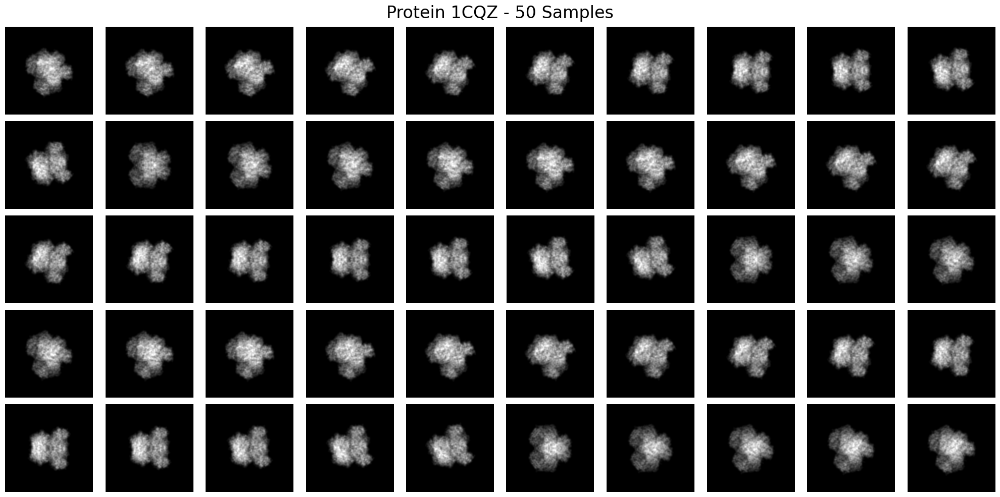

In [23]:
chose_name_protein = '8DNO'
protein_path = os.path.join(configs['train_protein_path'], chose_name_protein)
image_paths = os.listdir(protein_path)
image_paths = sorted(image_paths)
read_images = []
for path in image_paths:
    image = cv2.imread(os.path.join(protein_path, path))[:,:,::-1]
    read_images.append(image)

index = 50 
visualizedImages = read_images[index: index + 50]

fig, axes = plt.subplots(5, 10, figsize=(20, 10))

for i in range(50):
    row = i // 10
    col = i % 10
    axes[row, col].imshow(visualizedImages[i], cmap='gray')
    axes[row, col].axis('off')

fig.suptitle(f"Protein 1CQZ - 50 Samples", fontsize=24)
plt.tight_layout()
plt.show()


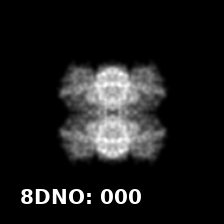

In [24]:
from IPython.display import Image, display

display(Image(filename="/data2/atran16/TestEman2/8DNO_600.gif"))

<h1>2.2. Create Data loader for Rafdb dataset!</h1>

In [25]:
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_tf = transforms.Compose([
    transforms.ToPILImage(), 
    transforms.Resize((224, 224)),
    transforms.RandomRotation(degrees=360, interpolation=InterpolationMode.BILINEAR, fill=0),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x + 0.02 * torch.randn_like(x)).clamp(0.0, 1.0)),
    transforms.Normalize(imagenet_mean, imagenet_std),
])

val_tf = transforms.Compose([
    transforms.ToPILImage(), 
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std),
])

test_tf = transforms.Compose([
    transforms.ToPILImage(), 
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std),
])

In [26]:
class PBD42Dataset(Dataset):
    def __init__(self, images, labels, transform):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        #img = (img * 255).astype(np.uint8)
        #img = Image.fromarray(img) 
        
        if self.transform:
            img = self.transform(img)
        label = self.labels[idx]
        return img, label

In [27]:
train_data = PBD42Dataset(train_image, train_label, transform=train_tf)
val_data   = PBD42Dataset(val_image, val_label, transform=val_tf)

train_loader = DataLoader(train_data, batch_size=100, shuffle=True)
val_loader   = DataLoader(val_data, batch_size=100, shuffle=False)

<h1>2.3. Exploring Data</h1>
<h1>2.3.1 Training images in train</h1>

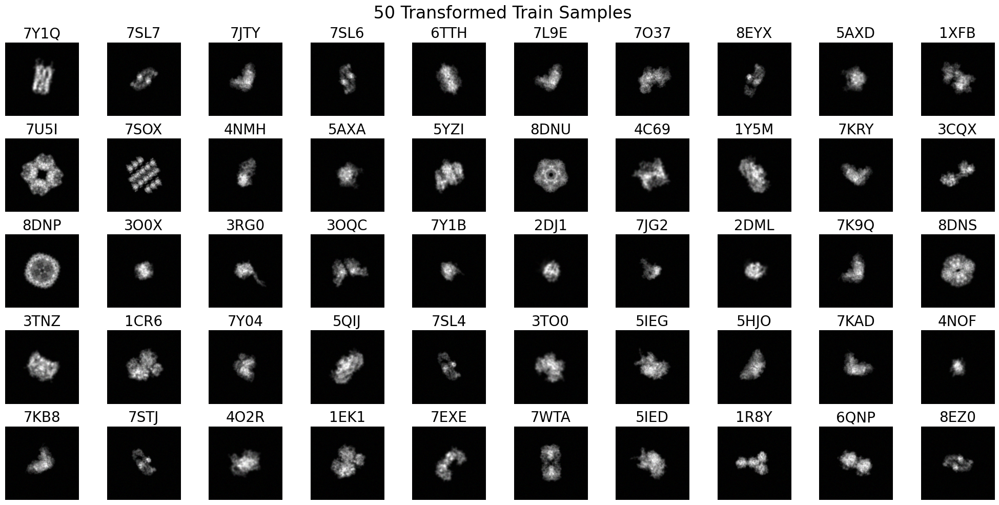

In [28]:
imagenet_mean_tensor  = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
imagenet_std_tensor    = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
#imagenet_mean_tensor  = torch.tensor([1, 1, 1]).view(3,1,1)
#imagenet_std_tensor    = torch.tensor([0, 0, 0]).view(3,1,1)
def denormalize(tensor):
    return (tensor * imagenet_std_tensor + imagenet_mean_tensor).clamp(0, 1)

images, labels = next(iter(train_loader))

images_to_show = images[:50]
labels_to_show = labels[:50]
plot_images = [denormalize(img).permute(1,2,0).numpy() for img in images_to_show]

fig, axes = plt.subplots(5, 10, figsize=(20, 10))

for i in range(50):
    row = i // 10
    col = i % 10
    axes[row, col].imshow(plot_images[i])
    axes[row, col].set_title(f"{class_names[labels_to_show[i].item()]}", fontsize=20)
    axes[row, col].axis('off')

fig.suptitle(f" 50 Transformed Train Samples", fontsize=24)
plt.tight_layout()
plt.show()

<h1>2.3.2 val images in val</h1>

Min value: -2.1179039478302
Max value: 2.640000104904175


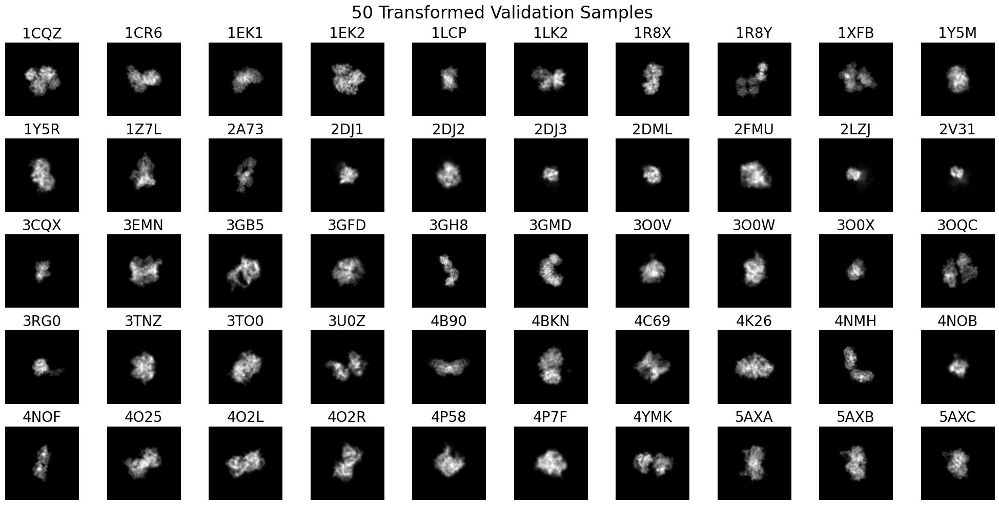

In [31]:
images, labels = next(iter(val_loader))
images_to_show = images[:50]
labels_to_show = labels[:50]
print("Min value:", images_to_show.min().item())
print("Max value:", images_to_show.max().item())
plot_images = [denormalize(img).permute(1,2,0).numpy() for img in images_to_show]

fig, axes = plt.subplots(5, 10, figsize=(20, 10))

for i in range(50):
    row = i // 10
    col = i % 10
    axes[row, col].imshow(plot_images[i])
    axes[row, col].set_title(f"{class_names[labels_to_show[i].item()]}", fontsize=20)
    axes[row, col].axis('off')

fig.suptitle(f" 50 Transformed Validation Samples", fontsize=24)
plt.tight_layout()
plt.show()

<h1>3.Loading and Setup model</h1>

In [32]:
import torch
import torch.nn as nn
import torchvision.models as models

model = None
num_classes = len(class_names)

if configs["model"] == "ResNet50":
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
    #model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, num_classes)

elif configs["model"] == "ViT":
    model = models.vit_b_16(weights=models.ViT_B_16_Weights.IMAGENET1K_V1)
    in_features = model.heads.head.in_features
    model.heads.head = nn.Linear(in_features, num_classes)

elif configs["model"] == "ConvNeXt":
    model = models.convnext_tiny(weights=models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
    in_features = model.classifier[2].in_features
    model.classifier[2] = nn.Linear(in_features, num_classes)

elif configs["model"] == "MaxViT":
    model = timm.create_model(
        "maxvit_tiny_tf_224",
        pretrained=True,
        in_chans=3,
        num_classes=num_classes
    )

else:
    raise ValueError(f"Unknown model: {configs['model']}")

print(f"Number of parameters: {sum(p.numel() for p in model.parameters()):,}")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
print(model)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /home/atran16/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 283MB/s]


Number of parameters: 23,768,255
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256

<h1>4. Setup training process</h1>

In [52]:
import torch
import tqdm

                       
class PDB42_Trainer:
    def __init__(self, model, device,
                 configs, class_names=None, topk=(1,3,5,10,20)):

        self.model = model.to(device)
        self.device = device     
        self.topk = topk
        self.configs = configs
        self.class_names = class_names

        # Tracking
        self.train_loss_list = []
        self.train_acc_list = []
        self.val_loss_list = []
        self.val_acc_list = []
        self.lr_list = []

        self.best_val_acc = 0.0
        self.best_val_loss = 0.0
        self.best_train_acc = 0.0
        self.best_train_loss = 0.0

        #Training configuration
        self.loss_fn = nn.CrossEntropyLoss()
        
        self.optimizer = None
        if configs['optimizer_chose'] == "RAdam":
            print("The selected optimizer is RAdam")
            self.optimizer = torch.optim.RAdam(
                params = model.parameters(),
                lr=configs['lr'])
            
        self.lr_scheduler = None
        if configs["lr_scheduler"] == "CosineAnnealingLR":
            print("The selected Lr Scheduler is CosineAnnealingLR")
            self.lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
                optimizer = self.optimizer,
                T_max=10,     
                eta_min=1e-6)

        #Creating Tracking

        header = ["epoch", "train_acc", "train_loss", "val_acc", "val_loss",
            "topk1train_acc", "topk3train_acc", "topk5train_acc", "topk10train_acc", "topk20train_acc",
            "topk1val_acc", "topk3val_acc", "topk5val_acc", "topk10val_acc", "topk20val_acc" ]
        
        with open(configs["tracking_csv"], mode="w", newline="") as f:
            writer = csv.writer(f)
            writer.writerow(header)
        print("TrackingTraining CSV is created!")

    def train_one_epoch(self, train_loader, epoch):

        self.model.train()
        total_loss = 0.0
        total_examples = 0
        total_correct = {f"{k}": 0 for k in self.topk}

        for images, labels in tqdm.tqdm(
            train_loader,
            total=len(train_loader),
            leave=True,
            colour="blue",
            desc=f"Epoch {epoch}"
        ):

            images = images.to(self.device)
            labels = labels.to(self.device)

            logits = self.model(images)
            loss = self.loss_fn(logits, labels)

            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()

            batch_size = labels.size(0)
            total_loss += loss.item() * batch_size
            total_examples += batch_size

            # ---- Top-K computation ----
            max_k = max(self.topk)
            _, pred = torch.topk(logits, k=max_k, dim=1)  # shape: [B, max_k]

            for k in self.topk:
                correct_k = (pred[:, :k] == labels.unsqueeze(1)).any(dim=1).sum().item()
                total_correct[f"{k}"] += correct_k

        avg_loss = total_loss / total_examples
        avg_acc = {k: total_correct[k] / total_examples for k in total_correct}
        
        return avg_loss, avg_acc

    def evaluate(self, val_loader, epoch):

        self.model.eval()
        total_loss = 0.0
        total_examples = 0
        total_correct = {f"{k}": 0 for k in self.topk}

        with torch.no_grad():
            for images, labels in tqdm.tqdm(
                val_loader,
                total=len(val_loader),
                leave=True,
                colour="green",
                desc=f"Epoch {epoch}"
            ):

                images = images.to(self.device)
                labels = labels.to(self.device)

                logits = self.model(images)
                loss = self.loss_fn(logits, labels)

                batch_size = labels.size(0)
                total_loss += loss.item() * batch_size
                total_examples += batch_size

                # ---- Top-K computation ----
                max_k = max(self.topk)
                _, pred = torch.topk(logits, k=max_k, dim=1)  # shape: [B, max_k]

                for k in self.topk:
                    correct_k = (pred[:, :k] == labels.unsqueeze(1)).any(dim=1).sum().item()
                    total_correct[f"{k}"] += correct_k


        avg_loss = total_loss / total_examples
        avg_acc = {k: total_correct[k] / total_examples for k in total_correct}

        return avg_loss, avg_acc


    def run(self, epochs, train_loader, val_loader):

        early_stop_flag = 0

        for epoch in range(1, epochs + 1):

            train_loss, train_acc_dict = self.train_one_epoch(train_loader, epoch)
            val_loss, val_acc_dict = self.evaluate(val_loader, epoch)

            train_acc = train_acc_dict["1"]
            val_acc = val_acc_dict["1"]

            self.train_loss_list.append(train_loss)
            self.train_acc_list.append(train_acc)
            self.val_loss_list.append(val_loss)
            self.val_acc_list.append(val_acc)

            # Clamp minimum LR
            for param_group in self.optimizer.param_groups:
                if param_group["lr"] < self.configs["min_lr"]:
                    param_group["lr"] = self.configs["min_lr"]

            current_lr = self.optimizer.param_groups[0]["lr"]
            self.lr_list.append(current_lr)

            print(
                f"Epoch: {epoch:02d} | "
                f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc*100:.2f}% | "
                f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc*100:.2f}% | "
                f"LR: {current_lr:.7f}"
            )

            print("Train Top-k, ", 
                  " || ".join([f"top{k}:{v*100:.2f}%" for k,v in train_acc_dict.items()]))

            print("Val Top-k, ", 
                  " || ".join([f"top{k}:{v*100:.2f}%" for k,v in val_acc_dict.items()]))

            self.lr_scheduler.step()

            # Save best model (based on Top1 validation)
            if val_acc > self.best_val_acc:
                self.best_val_acc = val_acc
                self.best_val_loss = val_loss
                self.best_train_acc = train_acc
                self.best_train_loss = train_loss
                early_stop_flag = 0

                print(f"Saved new best model at epoch {epoch}")

                state = {
                    **self.configs,
                    "net": self.model.state_dict(),
                    "best_val_loss": self.best_val_loss,
                    "best_val_acc": self.best_val_acc,
                    "best_train_loss": self.best_train_loss,
                    "best_train_acc": self.best_train_acc,
                    "train_loss_list": self.train_loss_list,
                    "val_loss_list": self.val_loss_list,
                    "train_acc_list": self.train_acc_list,
                    "val_acc_list": self.val_acc_list,
                    "optimizer": self.optimizer.state_dict(),
                }

                torch.save(state, self.configs['rs_dir'])

            early_stop_flag += 1
        
            if early_stop_flag > self.configs['earlyStopping']:
                print(f"Early stopping activated at epoch {epoch}")
                break
            
            # Create one sample row
            new_row = {"epoch": epoch, "train_acc": train_acc, "train_loss": train_loss, "val_acc": val_acc, "val_loss": val_loss, 
                       "topk1train_acc": train_acc_dict["1"], "topk3train_acc": train_acc_dict["3"], "topk5train_acc": train_acc_dict["5"], "topk10train_acc": train_acc_dict["10"], "topk20train_acc": train_acc_dict["20"],
                       "topk1val_acc": val_acc_dict["1"], "topk3val_acc": val_acc_dict["3"], "topk5val_acc": val_acc_dict["5"], "topk10val_acc": val_acc_dict["10"], "topk20val_acc": val_acc_dict["20"]
                      }
            
            with open(self.configs["tracking_csv"], mode="a", newline="") as f:
                writer = csv.DictWriter(f, fieldnames=new_row.keys())
                writer.writerow(new_row)

<h1>5. Start training and Evaluating</h1>

In [53]:
train_loader = DataLoader(train_data, batch_size = configs["batch_size"], shuffle=True)
val_loader = DataLoader(val_data , batch_size = configs["batch_size"], shuffle=False)

In [54]:
trainer = PDB42_Trainer(
    model=model,
    device=device,
    configs=configs,
    class_names=class_names
)

trainer.run(
    epochs=configs['max_epoch_num'],
    train_loader=train_loader,
    val_loader=val_loader
)

The selected optimizer is RAdam
The selected Lr Scheduler is CosineAnnealingLR
TrackingTraining CSV is created!


Epoch 1: 100%|██████████| 4/4 [00:00<00:00, 10.28it/s]


Epoch: 01 | Train Loss: 4.5120, Train Acc: 16.54% | Val Loss: 8.3259, Val Acc: 0.79% | LR: 0.0010000
Train Top-k,  top1:16.54% || top3:26.77% || top5:37.01% || top10:48.03% || top20:63.78%
Val Top-k,  top1:0.79% || top3:3.15% || top5:3.94% || top10:7.87% || top20:16.54%
Saved new best model at epoch 1


Epoch 2: 100%|██████████| 4/4 [00:00<00:00,  8.29it/s]


Epoch: 02 | Train Loss: 4.4887, Train Acc: 17.32% | Val Loss: 8.3956, Val Acc: 0.79% | LR: 0.0009756
Train Top-k,  top1:17.32% || top3:29.13% || top5:39.37% || top10:54.33% || top20:71.65%
Val Top-k,  top1:0.79% || top3:3.15% || top5:3.94% || top10:7.87% || top20:16.54%


Epoch 3: 100%|██████████| 4/4 [00:00<00:00, 10.30it/s]


Epoch: 03 | Train Loss: 4.4219, Train Acc: 22.83% | Val Loss: 8.2769, Val Acc: 0.79% | LR: 0.0009046
Train Top-k,  top1:22.83% || top3:35.43% || top5:46.46% || top10:64.57% || top20:77.95%
Val Top-k,  top1:0.79% || top3:3.15% || top5:3.94% || top10:7.87% || top20:16.54%


Epoch 4: 100%|██████████| 4/4 [00:00<00:00, 10.44it/s]


Epoch: 04 | Train Loss: 4.3335, Train Acc: 26.77% | Val Loss: 8.4665, Val Acc: 0.79% | LR: 0.0007941
Train Top-k,  top1:26.77% || top3:45.67% || top5:52.76% || top10:66.93% || top20:82.68%
Val Top-k,  top1:0.79% || top3:2.36% || top5:4.72% || top10:8.66% || top20:15.75%


Epoch 5: 100%|██████████| 4/4 [00:00<00:00, 10.56it/s]


Epoch: 05 | Train Loss: 4.2292, Train Acc: 33.86% | Val Loss: 9.4868, Val Acc: 1.57% | LR: 0.0006549
Train Top-k,  top1:33.86% || top3:49.61% || top5:59.84% || top10:74.80% || top20:91.34%
Val Top-k,  top1:1.57% || top3:3.15% || top5:4.72% || top10:7.87% || top20:15.75%
Saved new best model at epoch 5


Epoch 6: 100%|██████████| 4/4 [00:00<00:00, 10.28it/s]


Epoch: 06 | Train Loss: 4.1393, Train Acc: 30.71% | Val Loss: 11.1776, Val Acc: 0.79% | LR: 0.0005005
Train Top-k,  top1:30.71% || top3:55.12% || top5:67.72% || top10:81.10% || top20:93.70%
Val Top-k,  top1:0.79% || top3:2.36% || top5:3.94% || top10:7.87% || top20:15.75%


Epoch 7: 100%|██████████| 4/4 [00:00<00:00, 10.28it/s]


Epoch: 07 | Train Loss: 4.0429, Train Acc: 37.80% | Val Loss: 12.2263, Val Acc: 0.79% | LR: 0.0003461
Train Top-k,  top1:37.80% || top3:63.78% || top5:76.38% || top10:86.61% || top20:96.06%
Val Top-k,  top1:0.79% || top3:2.36% || top5:3.94% || top10:8.66% || top20:15.75%


Epoch 8: 100%|██████████| 4/4 [00:00<00:00, 10.18it/s]


Epoch: 08 | Train Loss: 3.9639, Train Acc: 41.73% | Val Loss: 12.8962, Val Acc: 0.79% | LR: 0.0002069
Train Top-k,  top1:41.73% || top3:64.57% || top5:80.31% || top10:92.13% || top20:96.85%
Val Top-k,  top1:0.79% || top3:2.36% || top5:3.94% || top10:8.66% || top20:14.96%


Epoch 9: 100%|██████████| 4/4 [00:00<00:00, 10.38it/s]


Epoch: 09 | Train Loss: 3.9655, Train Acc: 43.31% | Val Loss: 13.2421, Val Acc: 0.79% | LR: 0.0000964
Train Top-k,  top1:43.31% || top3:65.35% || top5:75.59% || top10:91.34% || top20:95.28%
Val Top-k,  top1:0.79% || top3:3.15% || top5:3.94% || top10:7.87% || top20:15.75%


Epoch 10: 100%|██████████| 4/4 [00:00<00:00, 10.03it/s]

Epoch: 10 | Train Loss: 3.8999, Train Acc: 48.03% | Val Loss: 12.9700, Val Acc: 0.79% | LR: 0.0000254
Train Top-k,  top1:48.03% || top3:68.50% || top5:76.38% || top10:90.55% || top20:97.64%
Val Top-k,  top1:0.79% || top3:2.36% || top5:3.94% || top10:7.87% || top20:15.75%


<h1>5.1 Result</h1>

In [55]:
!cat /data2/atran16/ProteinClassification_AnhTuanTran/27022026_train_result1/trainingTracking.csv

epoch,train_acc,train_loss,val_acc,val_loss,topk1train_acc,topk3train_acc,topk5train_acc,topk10train_acc,topk20train_acc,topk1val_acc,topk3val_acc,topk5val_acc,topk10val_acc,topk20val_acc
1,0.16535433070866143,4.5119966934985065,0.007874015748031496,8.325934443886824,0.16535433070866143,0.2677165354330709,0.3700787401574803,0.48031496062992124,0.6377952755905512,0.007874015748031496,0.031496062992125984,0.03937007874015748,0.07874015748031496,0.16535433070866143
2,0.1732283464566929,4.488691705418384,0.007874015748031496,8.395590019976998,0.1732283464566929,0.29133858267716534,0.3937007874015748,0.5433070866141733,0.7165354330708661,0.007874015748031496,0.031496062992125984,0.03937007874015748,0.07874015748031496,0.16535433070866143
3,0.2283464566929134,4.421873291646402,0.007874015748031496,8.27685938106747,0.2283464566929134,0.3543307086614173,0.4645669291338583,0.6456692913385826,0.7795275590551181,0.007874015748031496,0.031496062992125984,0.03937007874015748,0.07874015748031496,0.1

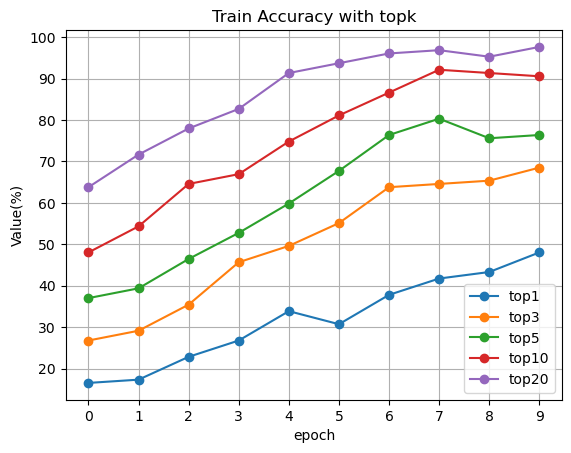

In [56]:
df = pd.read_csv(configs['tracking_csv'])
x = range(len(df['epoch']))  

# Create the line chart
plt.plot(x, df["topk1train_acc"] * 100, marker='o', label='top1')
plt.plot(x, df["topk3train_acc"] * 100, marker='o', label='top3')
plt.plot(x, df["topk5train_acc"] * 100, marker='o', label='top5')
plt.plot(x, df["topk10train_acc"] * 100, marker='o', label='top10')
plt.plot(x, df["topk20train_acc"] * 100, marker='o', label='top20')

# Add labels and title
plt.xlabel("epoch")
plt.ylabel("Value(%)")
plt.title("Train Accuracy with topk")
plt.legend()
plt.xticks(x)
plt.grid(True)

plt.show()

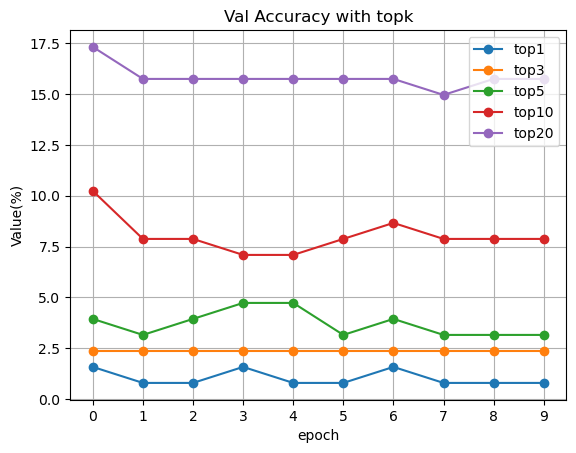

In [45]:
df = pd.read_csv(configs['tracking_csv'])
x = range(len(df['epoch']))  

# Create the line chart
plt.plot(x, df["topk1val_acc"] * 100, marker='o', label='top1')
plt.plot(x, df["topk3val_acc"] * 100, marker='o', label='top3')
plt.plot(x, df["topk5val_acc"] * 100, marker='o', label='top5')
plt.plot(x, df["topk10val_acc"] * 100, marker='o', label='top10')
plt.plot(x, df["topk20val_acc"] * 100, marker='o', label='top20')

# Add labels and title
plt.xlabel("epoch")
plt.ylabel("Value(%)")
plt.title("Val Accuracy with topk")
plt.legend()
plt.xticks(x)
plt.grid(True)

plt.show()

<h1> 6. test Images</h1>
<h1> 6.1 Loading testing images</h1>

In [115]:
images_per_class = []
labels_per_class = []
allStructureInTest = {0: "HYDROLASE", 1: "LIGASE", 2: "METAL_BINDING_PROTEIN", 3: "OXIDOREDUCTASE"}
for k, v in allStructureInTest.items():
    
    structures = os.path.join(configs['test_image_path'], v)
    #print(structures)
    proteins = os.listdir(structures)
    for protein in proteins:
        path = os.path.join(structures, protein)
        label_to_find = protein.upper()
        label = next((k for k, v in class_names.items() if v == label_to_find), -1)
        image_paths = os.listdir(path)
        for image_path in image_paths:
            images_per_class.append(os.path.join(path,image_path))
            labels_per_class.append(label)

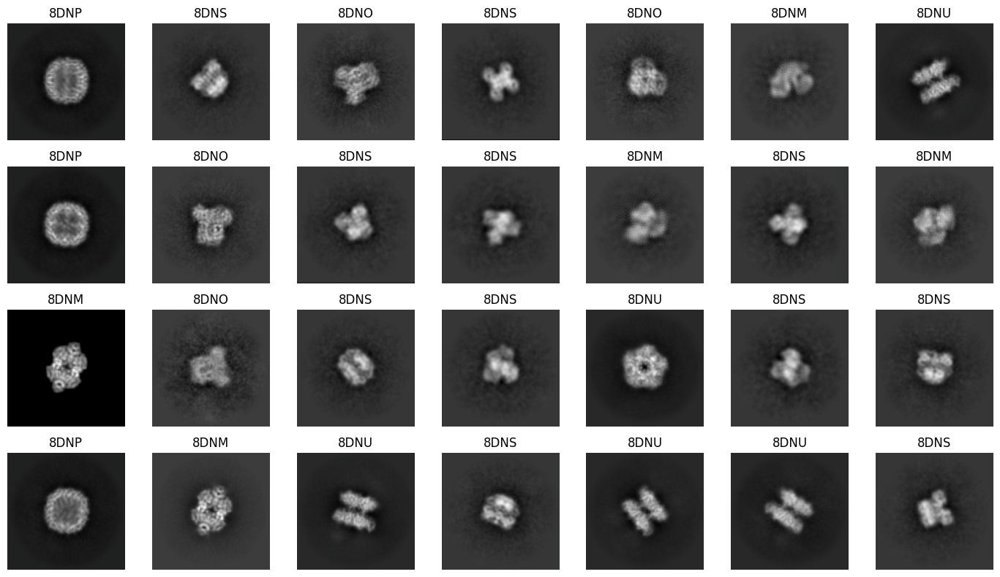

Min value: -1.9466564655303955
Max value: 1.9951199293136597


In [116]:
n = 28
rand_idx = random.sample(range(len(images_per_class)), n)

fig, axes = plt.subplots(4, 7, figsize=(14, 8))

for i, ax in enumerate(axes.flat):
    img_path = images_per_class[rand_idx[i]]   # <-- string path
    label = labels_per_class[rand_idx[i]]

    # 🔑 Load image from path
    img = cv2.imread(img_path)[:,:,::-1]
    img = test_tf(img)

    img_vis = denormalize(img) 
    ax.imshow(img_vis.permute(1, 2, 0))

    ax.set_title(
        class_names[int(label)].replace("_PROTEIN", ""),
        fontsize=12
    )
    ax.axis("off")

plt.tight_layout()
plt.show()
print("Min value:", img.min().item())
print("Max value:", img.max().item())

<h1>6.2 Testing</h1>

Top-127 acceptance accuracy: 100.00%


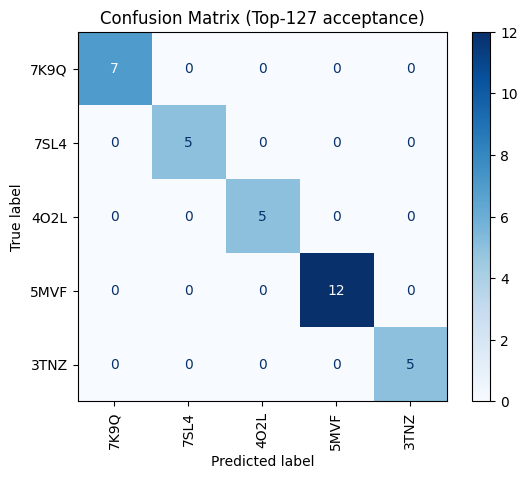

In [ ]:
# Example: user chooses k
top_k = 127

# Load model
checkpoint_path = configs['rs_dir']
state = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(state["net"])
model.to(device)
model.eval()

# Prepare results
y_true = []
y_pred = []

for i in range(len(images_per_class)):
    img_path = images_per_class[i]
    true_label = labels_per_class[i]

    img = cv2.imread(img_path)[:, :, ::-1]  # BGR to RGB
    img_tensor = test_tf(img)
    img_tensor = img_tensor.unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(img_tensor)
        probs = torch.softmax(logits, dim=1).squeeze(0)  # shape: [num_classes]

        # Get top-k indices
        topk_indices = torch.topk(probs, k=top_k).indices.tolist()

        # Accept prediction if true label is in top-k
        if true_label in topk_indices:
            pred_class = true_label
        else:
            pred_class = probs.argmax().item()

    y_true.append(true_label)
    y_pred.append(pred_class)

# Compute overall accuracy (top-k acceptance)
total_correct = sum(1 for t, p in zip(y_true, y_pred) if t == p)
topk_acc = total_correct / len(y_true)
print(f"Top-{top_k} acceptance accuracy: {topk_acc:.2%}")

# Optional: Confusion matrix
cm = confusion_matrix(y_true, y_pred)
unique_labels = sorted(list(set(y_true + y_pred)))
display_labels = [class_names[i] for i in unique_labels]

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_labels)
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title(f"Confusion Matrix (Top-{top_k} acceptance)")
plt.show()

In [206]:
# Compute unique labels appearing in test
unique_labels = sorted(list(set(y_true + y_pred)))
display_labels = [class_names[i] for i in unique_labels]

# Generate classification report
report = classification_report(
    y_true, 
    y_pred, 
    target_names=display_labels,
    zero_division=0 
)

print("Classification Report:\n")
print(report)


Classification Report:

              precision    recall  f1-score   support

        7WTA       1.00      1.00      1.00         1
        7SOX       1.00      1.00      1.00         1
        5AXD       1.00      1.00      1.00         1
        8EZ0       1.00      1.00      1.00         1
        4NOF       1.00      1.00      1.00         1
        7JTY       1.00      1.00      1.00         1
        2LZJ       1.00      1.00      1.00         1
        5IKO       1.00      1.00      1.00         1
        3OQC       1.00      1.00      1.00         1
        8EYY       1.00      1.00      1.00         1
        8DNM       1.00      1.00      1.00         1
        5IEG       1.00      1.00      1.00         1
        2DJ1       1.00      1.00      1.00         1
        7EPM       1.00      1.00      1.00         1
        8EYI       1.00      1.00      1.00         1
        7SL2       1.00      1.00      1.00         1
        5IEF       1.00      1.00      1.00         1
   

<h1>---------------------Test other by Tuan---------------------</h1>

In [ ]:
tuan_test_image, tuan_test_label = LoadData(dataset_folder = configs["valid_protein_path"], class_names=class_names)

In [204]:
import torch
import cv2
from torchvision import transforms
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

checkpoint_path = configs['rs_dir']

state = torch.load(checkpoint_path, map_location=device)

model.load_state_dict(state["net"]) 
model.to(device)
model.eval() 

top_k = 127

y_true = []
y_pred = []

for i in range(len(tuan_test_image)):
    img = tuan_test_image[i] 
    true_label = tuan_test_label[i] 
    img_tensor = val_tf(img) 
    
    img_tensor = img_tensor.unsqueeze(0).to(device) 

    with torch.no_grad():
        logits = model(img_tensor)
        probs = torch.softmax(logits, dim=1).squeeze(0)  # shape: [num_classes]

        # Get top-k indices
        topk_indices = torch.topk(probs, k=top_k).indices.tolist()

        # Accept prediction if true label is in top-k
        if true_label in topk_indices:
            pred_class = true_label
        else:
            pred_class = probs.argmax().item()

    y_true.append(true_label)
    y_pred.append(pred_class)

# Compute overall accuracy (top-k acceptance)
total_correct = sum(1 for t, p in zip(y_true, y_pred) if t == p)
topk_acc = total_correct / len(y_true)
print(f"Top-{top_k} acceptance accuracy: {topk_acc:.2%}")

# # Optional: Confusion matrix
# cm = confusion_matrix(y_true, y_pred)
# unique_labels = sorted(list(set(y_true + y_pred)))
# display_labels = [class_names[i] for i in unique_labels]

# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_labels)
# disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
# plt.title(f"Confusion Matrix (Top-{top_k} acceptance)")
# plt.show()

Top-127 acceptance accuracy: 100.00%


In [205]:
# Compute unique labels appearing in test
unique_labels = sorted(list(set(y_true + y_pred)))
display_labels = [class_names[i] for i in unique_labels]

# Generate classification report
report = classification_report(
    y_true, 
    y_pred, 
    target_names=display_labels,
    zero_division=0 
)

print("Classification Report:\n")
print(report)


Classification Report:

              precision    recall  f1-score   support

        7WTA       1.00      1.00      1.00         1
        7SOX       1.00      1.00      1.00         1
        5AXD       1.00      1.00      1.00         1
        8EZ0       1.00      1.00      1.00         1
        4NOF       1.00      1.00      1.00         1
        7JTY       1.00      1.00      1.00         1
        2LZJ       1.00      1.00      1.00         1
        5IKO       1.00      1.00      1.00         1
        3OQC       1.00      1.00      1.00         1
        8EYY       1.00      1.00      1.00         1
        8DNM       1.00      1.00      1.00         1
        5IEG       1.00      1.00      1.00         1
        2DJ1       1.00      1.00      1.00         1
        7EPM       1.00      1.00      1.00         1
        8EYI       1.00      1.00      1.00         1
        7SL2       1.00      1.00      1.00         1
        5IEF       1.00      1.00      1.00         1
   

<h1 style="text-align: center"> ------------------------------End here!------------------------------</h1>